### 1. Let's read data for Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import os

In [3]:
os.listdir("./Datasets")

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [4]:
uber_15 = pd.read_csv("./Datasets/uber-raw-data-janjune-15_sample.csv")
uber_15

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-02 21:43:00,B02764,237
1,B02682,2015-01-20 19:52:59,B02682,231
2,B02617,2015-03-19 20:26:00,B02617,161
3,B02764,2015-04-10 17:38:00,B02764,107
4,B02764,2015-03-23 07:03:00,B00111,140
...,...,...,...,...
99995,B02764,2015-04-13 16:12:00,B02764,234
99996,B02764,2015-03-06 21:32:00,B02764,24
99997,B02598,2015-03-19 19:56:00,B02598,17
99998,B02682,2015-05-02 16:02:00,B02682,68


### 2. Let's Perform Data pre-processing / Data ccleaning !

In [5]:
uber_15.isna().sum()

Dispatching_base_num       0
Pickup_date                0
Affiliated_base_num     1118
locationID                 0
dtype: int64

In [6]:
uber_15.nunique()

Dispatching_base_num        8
Pickup_date             84807
Affiliated_base_num       249
locationID                250
dtype: int64

In [7]:
sum(uber_15.duplicated())

54

In [8]:
uber_15.drop_duplicates(inplace = True)

In [9]:
sum(uber_15.duplicated())

0

In [10]:
uber_15.sample(5)

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
85045,B02598,2015-01-22 05:24:32,B02598,79
92860,B02765,2015-02-27 22:59:56,B02765,233
80097,B02764,2015-02-22 15:16:29,B02764,234
99927,B02764,2015-06-23 08:43:00,B02764,50
6136,B02764,2015-03-12 17:10:00,B02764,144


In [11]:
uber_15.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [12]:
uber_15["Pickup_date"] = pd.to_datetime(uber_15["Pickup_date"])

In [13]:
uber_15.sample(5)

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
5252,B02617,2015-02-10 07:44:11,B02617,68
82660,B02617,2015-02-22 01:29:35,B02617,234
11277,B02682,2015-06-05 07:55:00,B02682,146
20509,B02764,2015-06-01 19:30:00,B02376,90
67659,B02682,2015-06-22 00:17:00,B02682,255


### 3. Which month have max. uber pickups in New York City?

In [14]:
uber_15["month"] = uber_15.Pickup_date.dt.month_name()

In [15]:
uber_15["month"].value_counts()

month
June        19620
May         18660
April       15982
March       15969
February    15896
January     13819
Name: count, dtype: int64

<Axes: xlabel='month'>

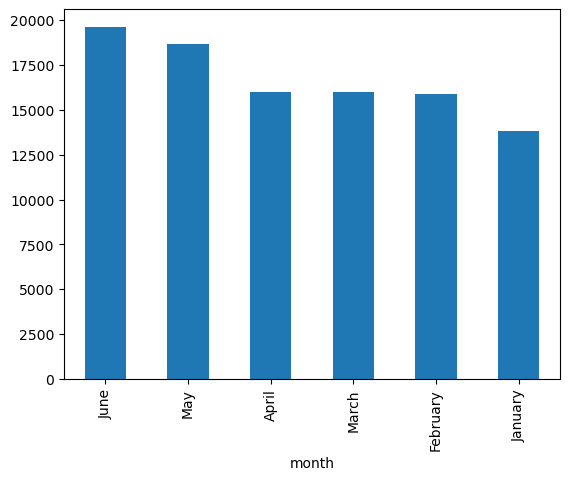

In [16]:
uber_15["month"].value_counts().plot(kind="bar")

In [17]:
uber_15["weekday"] = uber_15["Pickup_date"].dt.day_name()
uber_15["day"] = uber_15["Pickup_date"].dt.day
uber_15["hour"] = uber_15["Pickup_date"].dt.hour
uber_15["minute"] = uber_15["Pickup_date"].dt.minute

<Axes: xlabel='month', ylabel='count'>

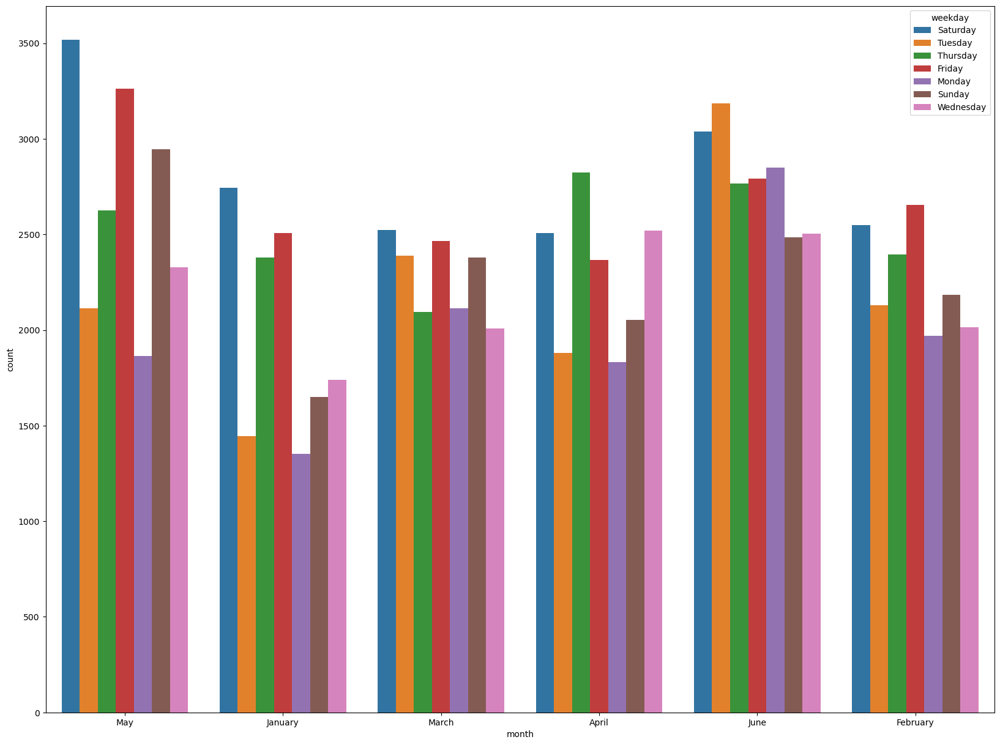

In [18]:
plt.figure(figsize=(20,15))
sns.countplot(x="month",hue="weekday",data=uber_15)

In [19]:
#another way

In [20]:
pivot = pd.crosstab(index=uber_15["month"], columns=uber_15["weekday"])
pivot

weekday,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
month,,,,,,,
April,2365,1833,2508,2052,2823,1880,2521
February,2655,1970,2550,2183,2396,2129,2013
January,2508,1353,2745,1651,2378,1444,1740
June,2793,2848,3037,2485,2767,3187,2503
March,2465,2115,2522,2379,2093,2388,2007
May,3262,1865,3519,2944,2627,2115,2328


<Axes: xlabel='month'>

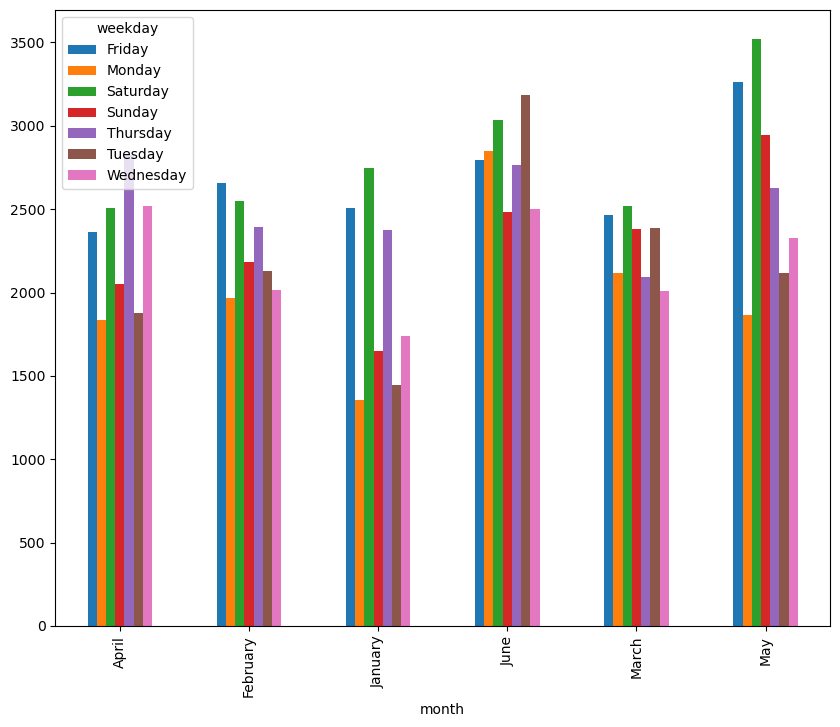

In [21]:
pivot.plot(kind="bar", figsize=(10,8))

In [22]:
#another way

<Axes: xlabel='month', ylabel='size'>

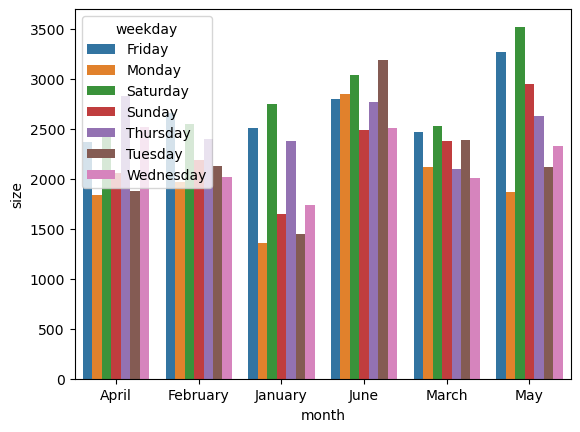

In [23]:
a = uber_15.groupby(["month","weekday"], as_index=False).size()
sns.barplot(data = a, x="month", y="size", hue="weekday")

### 4. Let's find out Hourly Rush in New York city on all days

In [24]:
uber_15

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month,weekday,day,hour,minute
0,B02617,2015-05-02 21:43:00,B02764,237,May,Saturday,2,21,43
1,B02682,2015-01-20 19:52:59,B02682,231,January,Tuesday,20,19,52
2,B02617,2015-03-19 20:26:00,B02617,161,March,Thursday,19,20,26
3,B02764,2015-04-10 17:38:00,B02764,107,April,Friday,10,17,38
4,B02764,2015-03-23 07:03:00,B00111,140,March,Monday,23,7,3
...,...,...,...,...,...,...,...,...,...
99995,B02764,2015-04-13 16:12:00,B02764,234,April,Monday,13,16,12
99996,B02764,2015-03-06 21:32:00,B02764,24,March,Friday,6,21,32
99997,B02598,2015-03-19 19:56:00,B02598,17,March,Thursday,19,19,56
99998,B02682,2015-05-02 16:02:00,B02682,68,May,Saturday,2,16,2


<Axes: xlabel='hour'>

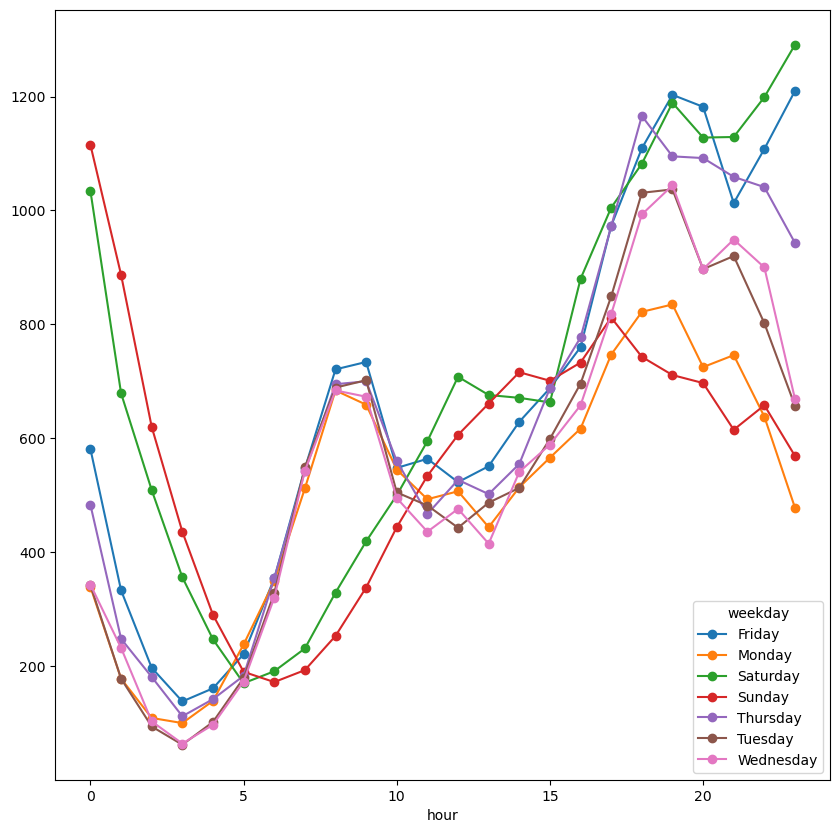

In [25]:
pd.crosstab(index=uber_15["hour"], columns=uber_15["weekday"]).plot(marker="o",figsize=(10,10))

In [26]:
summary = uber_15.groupby(["weekday","hour"], as_index=False).size()
summary

,weekday,hour,size
0,Friday,0,581
1,Friday,1,333
2,Friday,2,197
3,Friday,3,138
4,Friday,4,161
...,...,...,...
163,Wednesday,19,1044
164,Wednesday,20,897
165,Wednesday,21,949
166,Wednesday,22,900


<Axes: xlabel='hour', ylabel='size'>

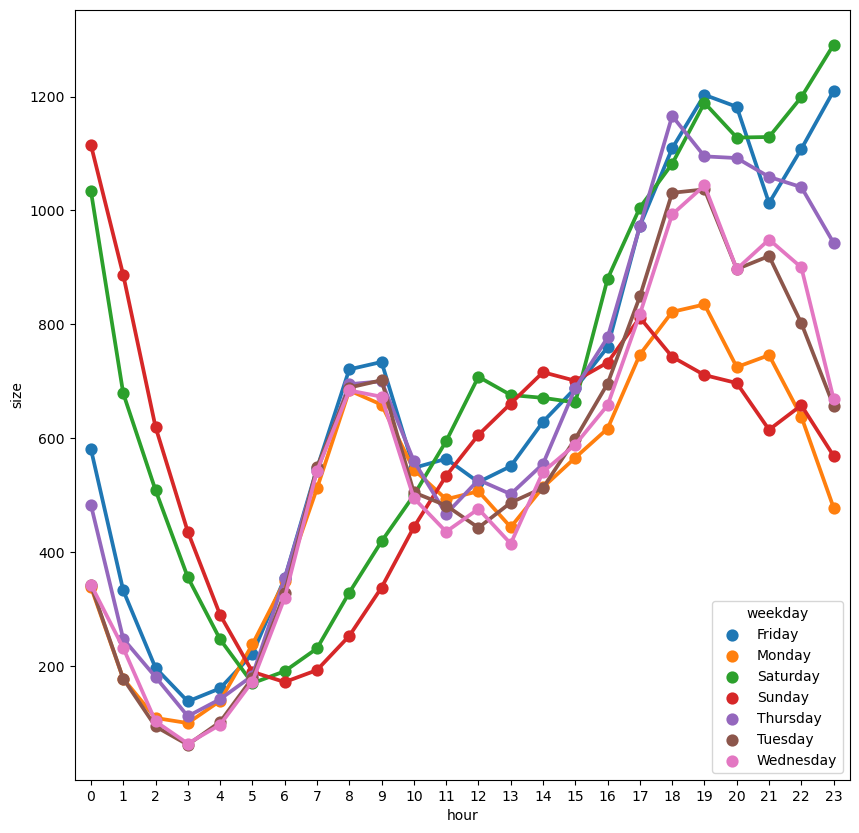

In [27]:
plt.figure(figsize=(10,10))
sns.pointplot(data=summary, x="hour", y="size", hue="weekday")

#### It is like weekend is starting from thursday itself for New York city

### 5. Which Base_number has most number of Active Vehicles ??

In [28]:
uber_15


,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month,weekday,day,hour,minute
0,B02617,2015-05-02 21:43:00,B02764,237,May,Saturday,2,21,43
1,B02682,2015-01-20 19:52:59,B02682,231,January,Tuesday,20,19,52
2,B02617,2015-03-19 20:26:00,B02617,161,March,Thursday,19,20,26
3,B02764,2015-04-10 17:38:00,B02764,107,April,Friday,10,17,38
4,B02764,2015-03-23 07:03:00,B00111,140,March,Monday,23,7,3
...,...,...,...,...,...,...,...,...,...
99995,B02764,2015-04-13 16:12:00,B02764,234,April,Monday,13,16,12
99996,B02764,2015-03-06 21:32:00,B02764,24,March,Friday,6,21,32
99997,B02598,2015-03-19 19:56:00,B02598,17,March,Thursday,19,19,56
99998,B02682,2015-05-02 16:02:00,B02682,68,May,Saturday,2,16,2


In [29]:
os.listdir("./Datasets")

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [30]:
uber_foil = pd.read_csv("./Datasets/Uber-Jan-Feb-FOIL.csv")

In [31]:
uber_foil.shape

(354, 4)

In [32]:
uber_foil.sample(5)

,dispatching_base_number,date,active_vehicles,trips
126,B02617,1/22/2015,1471,12143
29,B02765,1/5/2015,227,1133
19,B02682,1/4/2015,812,5621
240,B02764,2/10/2015,3700,29124
340,B02765,2/26/2015,745,6744


In [33]:
uber_foil["dispatching_base_number"].unique()

array(['B02512', 'B02765', 'B02764', 'B02682', 'B02617', 'B02598'],
      dtype=object)

In [34]:
# pip install chart_studio
# pip install plotly
#run above commands on anconda command prompt

In [35]:
# sns.boxplot(data=uber_foil, x="dispatching_base_number", y="active_vehicles")

In [36]:
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly.express as px

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [37]:
init_notebook_mode(connected=True)

In [38]:
px.box(data_frame=uber_foil, x="dispatching_base_number", y="active_vehicles")

In [39]:
#violon plot --> distribution + boxplot
px.violin(data_frame=uber_foil, x="dispatching_base_number", y="active_vehicles")

### 6. Collect entire data & Make it ready for the Data Analysis

In [40]:
os.listdir("./Datasets")

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [41]:
files = os.listdir("./Datasets")[-8:]

In [42]:
files.remove('uber-raw-data-janjune-15_sample.csv')

In [43]:
files.remove('uber-raw-data-janjune-15.csv')

In [44]:
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [45]:
final = pd.DataFrame()
for i in files:
    c_df = pd.read_csv("./Datasets/"+i)
    final = pd.concat([final,c_df], axis=0)


In [46]:
final.duplicated().sum()

82581

In [47]:
final.drop_duplicates(inplace=True)

In [48]:
final

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512
...,...,...,...,...
1028131,9/30/2014 22:57:00,40.7668,-73.9845,B02764
1028132,9/30/2014 22:57:00,40.6911,-74.1773,B02764
1028133,9/30/2014 22:58:00,40.8519,-73.9319,B02764
1028134,9/30/2014 22:58:00,40.7081,-74.0066,B02764


For better understanding of latitude and longitude refer image below

![Latitude and Longitude](https://cdn.britannica.com/63/2063-050-89E52B49/Perspective-globe-grid-parallels-meridians-longitude-latitude.jpg)

### 7. At what locations of New York City we are getting rush ??

In [49]:
final.nunique()

Date/Time    260093
Lat            7092
Lon           11453
Base              5
dtype: int64

In [50]:
heatmap_df = final.groupby(["Lat","Lon"], as_index=False).size()
heatmap_df

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1
...,...,...,...
574553,41.3730,-72.9237,1
574554,41.3737,-73.7988,1
574555,41.5016,-72.8987,1
574556,41.5276,-72.7734,1


In [51]:
import folium

In [52]:
basemap = folium.Map()

In [53]:
from folium.plugins import HeatMap

In [54]:
HeatMap(heatmap_df[["Lat", "Lon", "size"]]).add_to(basemap)

In [55]:
basemap

### 8. Examine rush on Hour and Weekday (Perform Pair wise Analysis)

In [56]:
final

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512
...,...,...,...,...
1028131,9/30/2014 22:57:00,40.7668,-73.9845,B02764
1028132,9/30/2014 22:57:00,40.6911,-74.1773,B02764
1028133,9/30/2014 22:58:00,40.8519,-73.9319,B02764
1028134,9/30/2014 22:58:00,40.7081,-74.0066,B02764


In [57]:
final.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [58]:
final["Date/Time"] = pd.to_datetime(final["Date/Time"], format="%m/%d/%Y %H:%M:%S")

In [59]:
final.sample(5)

,Date/Time,Lat,Lon,Base
233006,2014-09-25 13:02:00,40.7288,-73.9984,B02598
762171,2014-09-17 11:48:00,40.7682,-73.8621,B02682
573541,2014-07-30 19:44:00,40.7109,-74.0034,B02617
495717,2014-04-24 09:09:00,40.7704,-73.9817,B02682
22698,2014-08-21 22:45:00,40.8146,-73.9590,B02512


In [60]:
# lets create pivot table in another way without using crosstab

In [61]:
final["day"] = final["Date/Time"].dt.day
final["hour"] = final["Date/Time"].dt.hour 

In [62]:
final

,Date/Time,Lat,Lon,Base,day,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,1,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,1,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,1,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,1,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,1,0
...,...,...,...,...,...,...
1028131,2014-09-30 22:57:00,40.7668,-73.9845,B02764,30,22
1028132,2014-09-30 22:57:00,40.6911,-74.1773,B02764,30,22
1028133,2014-09-30 22:58:00,40.8519,-73.9319,B02764,30,22
1028134,2014-09-30 22:58:00,40.7081,-74.0066,B02764,30,22


In [64]:
pd.pivot_table(data=final, index="hour", columns="day", values="Base", aggfunc='count')

day,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
hour,,,,,,,,,,,,,,,,,,,,,
0,3178,2435,3354,2897,2733,4537,3645,2830,2657,3296,...,2787,2546,3200,2405,3810,5196,4123,2678,2401,2174
1,1944,1569,2142,1688,1541,2864,2296,1646,1724,2126,...,1637,1580,2055,1499,3065,3635,2646,1827,1510,1394
2,1256,1087,1407,1199,1030,1864,1507,1123,1222,1464,...,1175,1136,1438,1072,2046,2352,1843,1409,1112,1087
3,1308,1414,1467,1424,1253,1555,1597,1483,1480,1434,...,1468,1429,1493,1439,1806,2055,1802,1678,1403,919
4,1429,1876,1550,1696,1617,1551,1763,1889,1871,1591,...,1934,1957,1798,1943,1730,1723,1883,1948,1841,773
5,2126,2812,2387,2581,2900,2162,2422,3224,3168,2594,...,3151,3132,2754,2973,2337,2336,2793,3056,3216,997
6,3664,4920,4241,4592,4814,3642,4102,5431,5802,4664,...,5204,5204,4484,5356,3776,3539,4290,5213,5757,1561
7,5380,6544,5663,6029,6261,4766,5575,7361,7592,6046,...,6872,6890,6013,7627,5172,4937,5715,6852,7596,2169
8,5292,6310,5386,5704,6469,4942,5376,7357,7519,6158,...,6850,6436,5913,7078,5071,5053,5671,6695,7611,2410


In [65]:
# lets create pivot table in another way without using pivot_table

In [70]:
pivot = final.groupby(["hour","day"]).size().unstack()

In [71]:
pivot

day,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
hour,,,,,,,,,,,,,,,,,,,,,
0,3178,2435,3354,2897,2733,4537,3645,2830,2657,3296,...,2787,2546,3200,2405,3810,5196,4123,2678,2401,2174
1,1944,1569,2142,1688,1541,2864,2296,1646,1724,2126,...,1637,1580,2055,1499,3065,3635,2646,1827,1510,1394
2,1256,1087,1407,1199,1030,1864,1507,1123,1222,1464,...,1175,1136,1438,1072,2046,2352,1843,1409,1112,1087
3,1308,1414,1467,1424,1253,1555,1597,1483,1480,1434,...,1468,1429,1493,1439,1806,2055,1802,1678,1403,919
4,1429,1876,1550,1696,1617,1551,1763,1889,1871,1591,...,1934,1957,1798,1943,1730,1723,1883,1948,1841,773
5,2126,2812,2387,2581,2900,2162,2422,3224,3168,2594,...,3151,3132,2754,2973,2337,2336,2793,3056,3216,997
6,3664,4920,4241,4592,4814,3642,4102,5431,5802,4664,...,5204,5204,4484,5356,3776,3539,4290,5213,5757,1561
7,5380,6544,5663,6029,6261,4766,5575,7361,7592,6046,...,6872,6890,6013,7627,5172,4937,5715,6852,7596,2169
8,5292,6310,5386,5704,6469,4942,5376,7357,7519,6158,...,6850,6436,5913,7078,5071,5053,5671,6695,7611,2410


In [72]:
pivot.style.background_gradient()

day,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31
hour,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,3178,2435,3354,2897,2733,4537,3645,2830,2657,3296,3036,3227,5408,3748,2497,2547,3155,3390,3217,4475,4294,2787,2546,3200,2405,3810,5196,4123,2678,2401,2174
1,1944,1569,2142,1688,1541,2864,2296,1646,1724,2126,1665,2147,3509,2349,1515,1585,2048,2135,2188,3190,3194,1637,1580,2055,1499,3065,3635,2646,1827,1510,1394
2,1256,1087,1407,1199,1030,1864,1507,1123,1222,1464,1095,1393,2262,1605,1087,1119,1500,1332,1604,2100,1972,1175,1136,1438,1072,2046,2352,1843,1409,1112,1087
3,1308,1414,1467,1424,1253,1555,1597,1483,1480,1434,1424,1362,1832,1656,1381,1395,1488,1626,1675,1858,1727,1468,1429,1493,1439,1806,2055,1802,1678,1403,919
4,1429,1876,1550,1696,1617,1551,1763,1889,1871,1591,1842,1757,1705,1756,1862,1818,1897,1892,1810,1618,1926,1934,1957,1798,1943,1730,1723,1883,1948,1841,773
5,2126,2812,2387,2581,2900,2162,2422,3224,3168,2594,2520,2710,2327,2629,2980,2966,2741,2959,2639,2143,2615,3151,3132,2754,2973,2337,2336,2793,3056,3216,997
6,3664,4920,4241,4592,4814,3642,4102,5431,5802,4664,4954,4576,4196,4257,5050,5558,4562,4688,4733,3584,4185,5204,5204,4484,5356,3776,3539,4290,5213,5757,1561
7,5380,6544,5663,6029,6261,4766,5575,7361,7592,6046,6876,6250,5685,5781,6837,7517,6315,6618,6159,4900,5727,6872,6890,6013,7627,5172,4937,5715,6852,7596,2169
8,5292,6310,5386,5704,6469,4942,5376,7357,7519,6158,6871,6231,6060,5520,6729,7495,5882,6451,6014,5083,5529,6850,6436,5913,7078,5071,5053,5671,6695,7611,2410


### 9. How to Automate your analysis

In [82]:
final["minute"] = final["Date/Time"].dt.minute
final["weekday"] = final["Date/Time"].dt.day_name()

In [83]:
def pair_wise_analysis(a,b):
    
    pivot = final.groupby([a,b]).size().unstack()
    return pivot.style.background_gradient()


In [84]:
pair_wise_analysis("hour","minute")

minute,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59
hour,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2173,2112,2106,1984,2055,2075,2097,2015,1906,1974,1968,1918,1997,2006,1923,1960,1845,1848,1815,1752,1764,1813,1760,1764,1750,1631,1716,1691,1686,1721,1762,1637,1610,1678,1573,1629,1510,1537,1581,1527,1515,1525,1544,1474,1559,1446,1449,1451,1440,1468,1483,1493,1417,1461,1402,1350,1413,1361,1347,1409
1,1357,1405,1373,1380,1338,1347,1313,1350,1262,1232,1294,1259,1264,1203,1213,1232,1216,1246,1223,1202,1197,1174,1170,1167,1138,1126,1096,1116,1126,1105,1038,1118,1021,1066,1010,1021,1076,953,961,1009,957,973,941,940,932,1002,940,982,957,883,1012,906,942,909,881,858,861,858,893,889
2,885,909,905,868,861,884,817,808,774,834,887,812,766,855,741,775,792,734,751,764,695,746,761,735,755,712,699,710,784,697,725,723,706,705,708,707,664,692,676,662,690,704,716,690,695,705,686,724,689,696,718,699,731,687,721,738,732,725,739,729
3,802,826,825,767,779,783,797,759,759,760,799,797,696,757,757,758,771,765,770,783,737,803,772,780,771,790,826,785,811,798,794,810,786,771,782,818,758,826,780,788,815,754,780,769,792,783,784,801,800,775,851,771,851,846,845,803,809,825,790,791
4,844,842,820,837,815,843,883,840,826,832,898,827,919,829,862,889,894,725,812,852,893,907,887,875,892,926,907,901,888,911,937,864,863,967,921,938,890,889,905,954,932,924,900,945,986,942,937,909,954,897,875,946,977,1008,994,1001,1058,1020,1016,1021
5,1075,1069,1025,1082,1111,1148,1134,1129,1047,1093,1109,1157,1146,1107,1167,1192,1211,1219,1253,1221,1224,1264,1311,1322,1403,1416,1391,1440,1423,1461,1445,1433,1391,1461,1471,1473,1512,1502,1443,1499,1564,1586,1535,1530,1485,1546,1483,1533,1460,1502,1525,1582,1568,1527,1600,1628,1643,1690,1672,1711
6,1686,1746,1806,1783,1746,1789,1735,1882,1870,1959,1926,1987,2019,2075,2080,2057,2090,2091,2192,2151,2208,2289,2264,2289,2396,2392,2428,2424,2375,2524,2451,2472,2363,2428,2603,2497,2495,2495,2594,2591,2662,2593,2675,2666,2637,2628,2636,2671,2646,2569,2616,2537,2700,2687,2703,2645,2784,2720,2796,2780
7,2865,2899,2910,2831,2980,3081,2961,2968,3076,3068,3213,3085,3152,3113,3243,3201,3128,3055,3075,3148,3285,3081,3116,3268,3288,3406,3319,3337,3400,3324,3386,3169,3293,3183,3236,3341,3256,3314,3451,3355,3448,3206,3107,3082,3154,3271,3115,3113,3043,3041,3211,3018,3106,3103,3001,3142,3119,3191,3191,3203
8,3268,3191,3102,3180,3245,3213,3305,3467,3344,3352,3503,3452,3327,3399,3315,3361,3242,3268,3287,3075,3225,3162,3233,3159,3151,3421,3266,3254,3272,3253,3243,3225,3149,3165,3200,3112,3156,3118,3179,3082,3195,3088,3041,3013,3074,3019,2957,2856,2845,2784,2814,2791,2816,2694,2733,2759,2681,2640,2721,2724


In [85]:
pair_wise_analysis("weekday","hour")

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,,,,
Friday,13447,8002,5232,6788,8641,13168,22988,31522,30926,24803,23763,24727,25438,29822,35569,42910,47315,50997,53746,48657,42713,47389,48471,40498
Monday,6327,3679,2885,6106,9460,14737,23285,30650,28764,21854,19950,19973,20117,23005,27696,32201,38149,41351,36359,33512,32279,28401,19805,11588
Saturday,27096,18783,12464,9356,6746,6990,8450,10831,14176,17384,20218,22320,23879,26177,30851,38104,42735,42013,44995,40271,37922,42938,47107,42388
Sunday,32275,22610,15126,10393,6261,6086,6492,8584,11909,16113,19476,22410,23469,25937,27603,30570,32383,30951,27726,25419,24601,23539,19227,11998
Thursday,9116,5169,3629,5532,8355,13889,26561,36393,34856,27376,25502,25538,25983,30300,36048,43604,49615,55645,54768,50927,51044,50938,43381,27203
Tuesday,6116,3437,2502,4394,7404,13938,26361,35935,33304,24591,23273,23234,23392,28544,34234,40641,47849,54483,49258,43954,43875,39224,27211,14599
Wednesday,7499,4233,3060,4762,7379,13542,26462,35810,33231,25195,24273,24485,25083,28642,34512,42606,49764,54584,51732,46096,46875,43754,32222,17803


In [86]:
pair_wise_analysis("day","hour")

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203
